# **1. Data Overview**

In [1]:
import os

data_dir = "/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768"
classes = os.listdir(data_dir)
for cls in classes:
    print(f"Class: {cls}, Number of Images: {len(os.listdir(os.path.join(data_dir, cls)))}")


Class: Dried, Number of Images: 2029
Class: Healthy, Number of Images: 5288
Class: Unhealthy, Number of Images: 2099


# **2. Image Dimension**

In [2]:
from PIL import Image

image_sizes = []
for cls in classes:
    for img_file in os.listdir(os.path.join(data_dir, cls)):
        img = Image.open(os.path.join(data_dir, cls, img_file))
        image_sizes.append(img.size)

print(set(image_sizes))  


{(1024, 768)}


# **3. Data Distribution**

/usr/local/lib/python3.11/dist-packages/seaborn/_oldcore.py:1765: FutureWarning: unique with argument that is not not a Series, Index, ExtensionArray, or np.ndarray is deprecated and will raise in a future version.
  order = pd.unique(vector)


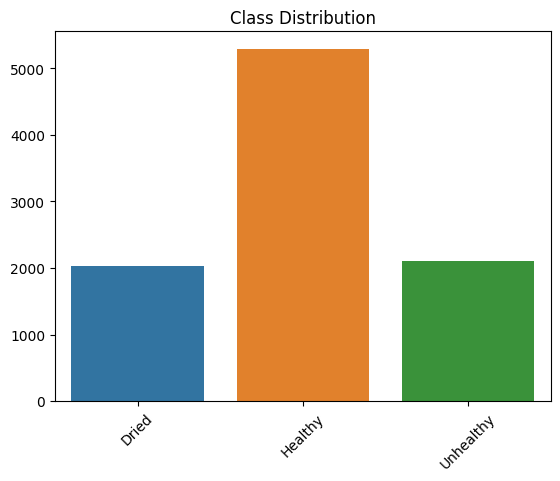

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns

class_counts = [len(os.listdir(os.path.join(data_dir, cls))) for cls in classes]
sns.barplot(x=classes, y=class_counts)
plt.xticks(rotation=45)
plt.title("Class Distribution")
plt.show()


# **4. Data Visualization**

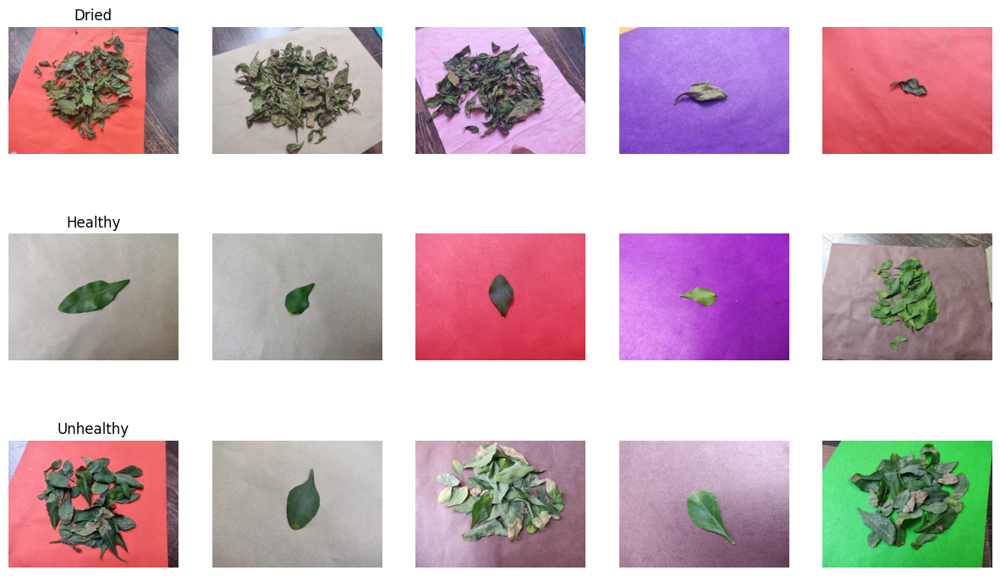

In [4]:
import random
import matplotlib.pyplot as plt

fig, axes = plt.subplots(len(classes), 5, figsize=(15, len(classes) * 3))
for i, cls in enumerate(classes):
    class_dir = os.path.join(data_dir, cls)
    for j in range(5):
        img_path = os.path.join(class_dir, random.choice(os.listdir(class_dir)))
        img = Image.open(img_path)
        axes[i, j].imshow(img)
        axes[i, j].axis("off")
        if j == 0:
            axes[i, j].set_title(cls)
plt.show()

# **5. Image Quality**

In [5]:
corrupted_images = []
for cls in classes:
    for img_file in os.listdir(os.path.join(data_dir, cls)):
        try:
            img = Image.open(os.path.join(data_dir, cls, img_file))
            img.verify()  # Check for corruption
        except (IOError, SyntaxError):
            corrupted_images.append(img_file)

print("Corrupted Images:", corrupted_images)


Corrupted Images: []


# **6. Colour Analysis**

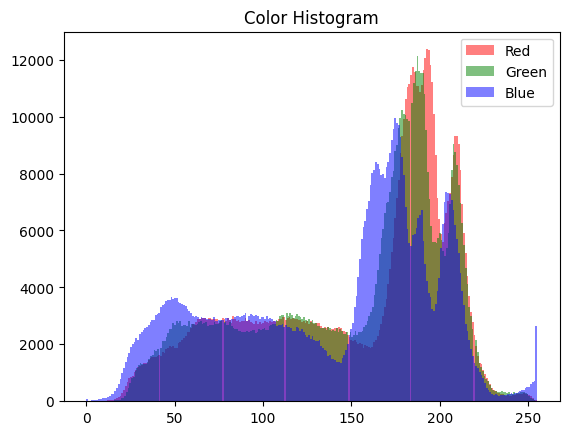

In [6]:
import numpy as np

def plot_color_histogram(image_path):
    img = Image.open(image_path)
    img_array = np.array(img)
    for i, color in enumerate(['Red', 'Green', 'Blue']):
        plt.hist(img_array[..., i].ravel(), bins=256, color=color.lower(), alpha=0.5, label=color)
    plt.legend()
    plt.title("Color Histogram")
    plt.show()

plot_color_histogram("/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768/Dried/1007.jpg")

# **7. Statistical Analysis**

In [7]:
import torchvision.transforms as transforms

transform = transforms.ToTensor()
stats = {cls: {"mean": [], "std": []} for cls in classes}

for cls in classes:
    for img_file in os.listdir(os.path.join(data_dir, cls)):
        img = Image.open(os.path.join(data_dir, cls, img_file))
        img_tensor = transform(img)
        stats[cls]["mean"].append(img_tensor.mean().item())
        stats[cls]["std"].append(img_tensor.std().item())

for cls, values in stats.items():
    print(f"Class: {cls}, Mean: {sum(values['mean'])/len(values['mean'])}, Std: {sum(values['std'])/len(values['std'])}")


Class: Dried, Mean: 0.5687865675553246, Std: 0.2142767940081946
Class: Healthy, Mean: 0.5844671983446549, Std: 0.1892981316398339
Class: Unhealthy, Mean: 0.5558499094771453, Std: 0.21123636004582877


# **8. Data Augmentation Insights**

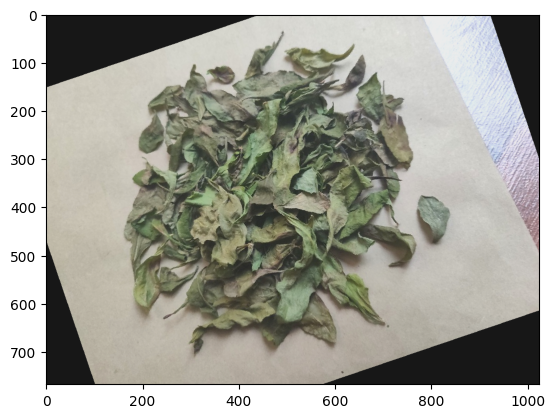

In [8]:
from torchvision import transforms

augmentation = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor()
])

img = Image.open("/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768/Dried/1002.jpg")
augmented_img = augmentation(img)

plt.imshow(augmented_img.permute(1, 2, 0))  
plt.show()


# **9. Feature Engineering Create Dataloader**

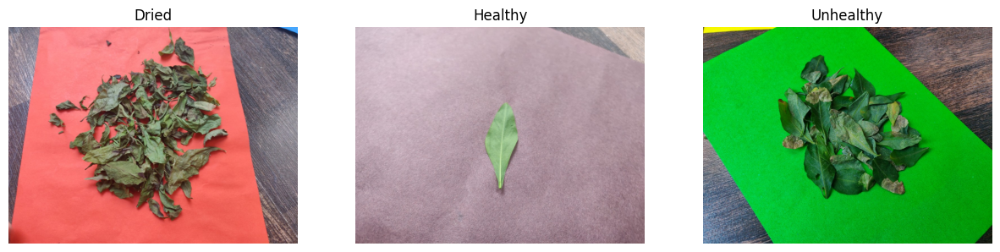

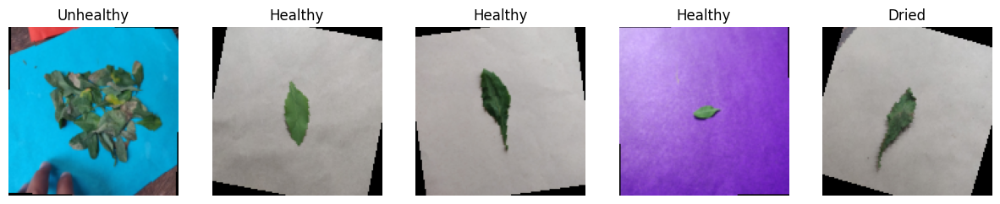

Applying augmentation and transformations


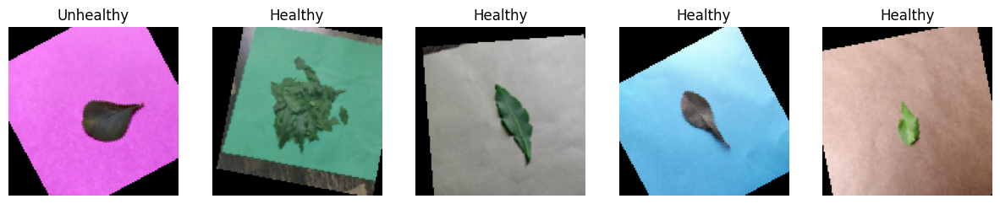

Feature Engineering Results:
Image 1: Mean = 0.2384, Std = 0.4694
Image 2: Mean = -0.0170, Std = 0.5736
Image 3: Mean = 0.2280, Std = 0.4311
Image 4: Mean = -0.0740, Std = 0.5083
Image 5: Mean = 0.1506, Std = 0.4859


In [9]:
import torch
from torchvision import transforms, datasets
from PIL import Image
import matplotlib.pyplot as plt
import random

data_dir = "/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768"  # Update with your dataset path

# Helper function to load and display random images from each folder
def visualize_images(data_dir):
    class_names = os.listdir(data_dir)
    fig, axes = plt.subplots(1, len(class_names), figsize=(15, 5))

    for i, class_name in enumerate(class_names):
        class_dir = os.path.join(data_dir, class_name)
        image_file = random.choice(os.listdir(class_dir))
        image_path = os.path.join(class_dir, image_file)

        img = Image.open(image_path)
        axes[i].imshow(img)
        axes[i].set_title(class_name)
        axes[i].axis("off")

    plt.show()


visualize_images(data_dir)

transform_pipeline = transforms.Compose([
    transforms.Resize((128, 128)),  
    transforms.RandomHorizontalFlip(), 
    transforms.RandomRotation(20),  
    transforms.ToTensor(), 
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  
])


image_dataset = datasets.ImageFolder(root=data_dir, transform=transform_pipeline)
dataloader = torch.utils.data.DataLoader(image_dataset, batch_size=16, shuffle=True)

def visualize_augmented_images(dataloader):
    images, labels = next(iter(dataloader))
    fig, axes = plt.subplots(1, len(images[:5]), figsize=(15, 5))

    for i in range(5):
        img = images[i].permute(1, 2, 0).numpy()  
        img = img * 0.5 + 0.5  

        axes[i].imshow(img)
        axes[i].set_title(image_dataset.classes[labels[i]])
        axes[i].axis("off")

    plt.show()

visualize_augmented_images(dataloader)

print("Applying augmentation and transformations")
custom_transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1), 
    transforms.RandomAffine(degrees=30, translate=(0.1, 0.1), scale=(0.9, 1.1)), 
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  
])

augmented_dataset = datasets.ImageFolder(root=data_dir, transform=custom_transform)
augmented_loader = torch.utils.data.DataLoader(augmented_dataset, batch_size=16, shuffle=True)

visualize_augmented_images(augmented_loader)

def compute_features(loader):
    features = []
    for images, labels in loader:
        for img in images:
            mean = img.mean().item()
            std = img.std().item()
            features.append((mean, std))
    return features

features = compute_features(dataloader)
print("Feature Engineering Results:")
for i, (mean, std) in enumerate(features[:5]):
    print(f"Image {i+1}: Mean = {mean:.4f}, Std = {std:.4f}")


# **10. Histogram Equalization**

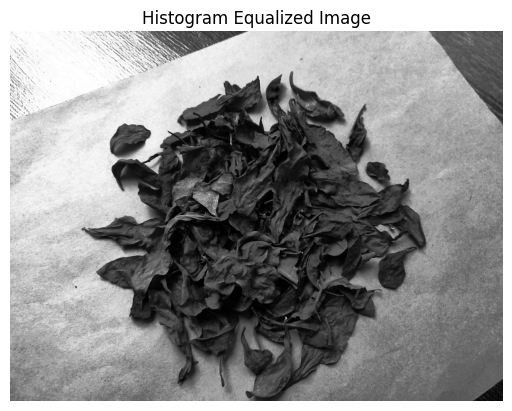

In [10]:
import cv2
import numpy as np

def histogram_equalization(image):
   
    img_gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
    equalized_img = cv2.equalizeHist(img_gray)
    return equalized_img

img = Image.open("/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768/Dried/1000.jpg")
equalized = histogram_equalization(img)
plt.imshow(equalized, cmap="gray")
plt.title("Histogram Equalized Image")
plt.axis("off")
plt.show()


# **11. Edge Detection**

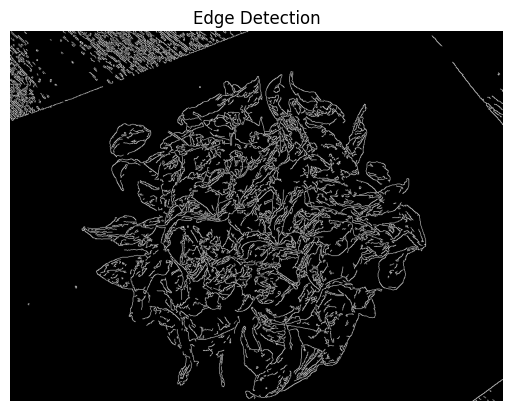

In [11]:
def edge_detection(image, method="canny"):

    img_gray = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2GRAY)
    
    if method == "canny":
        edges = cv2.Canny(img_gray, 100, 200)  # Adjust thresholds as needed
    elif method == "sobel":
        edges_x = cv2.Sobel(img_gray, cv2.CV_64F, 1, 0, ksize=3)
        edges_y = cv2.Sobel(img_gray, cv2.CV_64F, 0, 1, ksize=3)
        edges = cv2.magnitude(edges_x, edges_y)
    
    return edges

edges = edge_detection(img, method="canny")
plt.imshow(edges, cmap="gray")
plt.title("Edge Detection")
plt.axis("off")
plt.show()


# **12. Gaussian Blur**

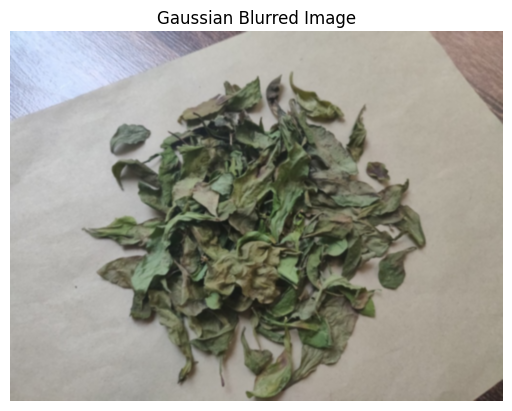

In [12]:
def apply_gaussian_blur(image, kernel_size=5):

    img_array = np.array(image)
    blurred = cv2.GaussianBlur(img_array, (kernel_size, kernel_size), 0)
    return Image.fromarray(blurred)

blurred_img = apply_gaussian_blur(img, kernel_size=7)
plt.imshow(blurred_img)
plt.title("Gaussian Blurred Image")
plt.axis("off")
plt.show()


# **Import Required Libraries**

In [13]:
!pip install git+https://github.com/jacobgil/pytorch-grad-cam.git


!pip install lime

  Cloning https://github.com/jacobgil/pytorch-grad-cam.git to /tmp/pip-req-build-wyf3tj1y
  Running command git clone --filter=blob:none --quiet https://github.com/jacobgil/pytorch-grad-cam.git /tmp/pip-req-build-wyf3tj1y
  Resolved https://github.com/jacobgil/pytorch-grad-cam.git to commit 781dbc0d16ffa95b6d18b96b7b829840a82d93d1
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [14]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms, models
from torchvision.transforms import ToTensor
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import precision_score, recall_score, f1_score
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, EigenCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from lime import lime_image
import zipfile
import os
from tqdm import tqdm  

# **Load & Prepare the Dataset**

In [15]:
transform_train = transforms.Compose([
    transforms.RandomResizedCrop(224),      
    transforms.RandomHorizontalFlip(),     
    transforms.Normalize((0.5,), (0.5,))
])

transform_test = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))
])

dataset = datasets.ImageFolder(root="/kaggle/input/plumbago-zeylanica-dataset/Plumbago Zeylanica 1024 x 768(1)/1024 x 768", transform=transform_train)
train_size = int(0.7 * len(dataset))
val_size = int(0.2 * len(dataset))
test_size = len(dataset) - train_size - val_size
train_dataset, val_dataset, test_dataset = random_split(dataset, [train_size, val_size, test_size])

val_dataset.dataset.transform = transform_test
test_dataset.dataset.transform = transform_test

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

# **Visualize example image for each class**

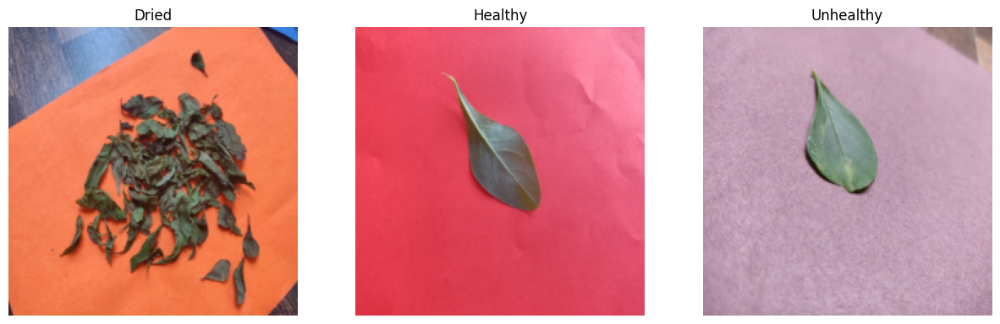

In [16]:
class_names = dataset.classes
num_classes = len(class_names)

fig, axs = plt.subplots(1, num_classes, figsize=(15, 5))

displayed_classes = {class_name: False for class_name in class_names}

for images, labels in train_loader:
    for img, label in zip(images, labels):
        class_name = class_names[label]
        if not displayed_classes[class_name]:
            img = img.permute(1, 2, 0).numpy()
            img = (img * 0.5) + 0.5  
            axs[label].imshow(np.clip(img, 0, 1))  
            axs[label].set_title(class_name)
            axs[label].axis('off')
            displayed_classes[class_name] = True 

        if all(displayed_classes.values()):
            break

    if all(displayed_classes.values()):
        break

plt.show()


# **Custom CNN Model**

In [92]:
class CustomCNN(nn.Module):
    def __init__(self):
        super(CustomCNN, self).__init__()
        
        self.conv1 = nn.Conv2d(3, 64, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(128, 256, kernel_size=3, padding=1)

        self.pool = nn.MaxPool2d(2, 2)
        self.adaptive_pool = nn.AdaptiveAvgPool2d((7, 7))

        self.fc1 = nn.Linear(256 * 7 * 7, 512)
        self.fc2 = nn.Linear(512, 256)
        self.fc3 = nn.Linear(256, num_classes)

        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):
        x = self.pool(torch.relu(self.conv1(x)))
        x = self.pool(torch.relu(self.conv2(x)))
        x = self.pool(torch.relu(self.conv3(x)))
        x = self.adaptive_pool(x)
        x = x.view(x.size(0), -1)

        x = self.dropout(torch.relu(self.fc1(x)))
        x = self.dropout(torch.relu(self.fc2(x)))
        x = self.fc3(x)
        return x


# **Transfer Learning Model**

In [93]:
import torch.nn as nn
from torchvision import models

def get_transfer_model(model_name, num_classes):
    if model_name == "vgg19":
        model = models.vgg19(pretrained=True)
        # Replace the final classification layer
        model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

    elif model_name == "efficientnet_b3":
        model = models.efficientnet_b3(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_name == "efficientnet_b6":
        model = models.efficientnet_b6(pretrained=True)
        model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

    elif model_name == "resnet152":
        model = models.resnet152(pretrained=True)
        model.fc = nn.Linear(model.fc.in_features, num_classes)

    elif model_name == "densenet201":
        model = models.densenet201(pretrained=True)
        model.classifier = nn.Linear(model.classifier.in_features, num_classes)

    else:
        raise ValueError(f"Model '{model_name}' not supported. Choose from: "
                         "vgg19, efficientnet_b3, efficientnet_b6, resnet152, densenet201.")

    return model


# **Training & Early Stopping**

In [94]:
class EarlyStopping:

    def __init__(self, patience=5):

        self.patience = patience
        self.counter = 0
        self.best_loss = np.inf

    def check_early_stop(self, val_loss):
        if val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                return True
        return False


# **Training Using Custom CNN**

In [95]:
from tqdm import tqdm  
from torch.cuda.amp import autocast, GradScaler 

num_epochs = 50  

model = CustomCNN().to('cuda') 

criterion = nn.CrossEntropyLoss() 

optimizer = optim.Adam(model.parameters(), lr=0.001) 

early_stopping = EarlyStopping(patience=5)  

train_losses, val_losses = [], [] 

scaler = GradScaler()

for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train()  
    train_loss = 0 

    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda') 
        optimizer.zero_grad()  
        with autocast():  
            outputs = model(images)  
            loss = criterion(outputs, labels)  

        scaler.scale(loss).backward() 
        scaler.step(optimizer)  
        scaler.update()  
        train_loss += loss.item() 

    model.eval() 
    val_loss = 0  
    with torch.no_grad():  
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda') 
            with autocast():  
                outputs = model(images)  
                loss = criterion(outputs, labels)  
            val_loss += loss.item() 

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break
        
torch.save(model.state_dict(), 'cnn_model.pth')
print("Model saved as 'cnn_model.pth'")


/tmp/ipykernel_137/2275514536.py:16: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/2275514536.py:27: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/2275514536.py:41: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.6842, Validation Loss: 0.3071
Epoch 2/50


Train Loss: 0.2668, Validation Loss: 0.1469
Epoch 3/50


Train Loss: 0.1783, Validation Loss: 0.1256
Epoch 4/50


Train Loss: 0.1509, Validation Loss: 0.0995
Epoch 5/50


Train Loss: 0.1140, Validation Loss: 0.0792
Epoch 6/50


Train Loss: 0.0933, Validation Loss: 0.1075
Epoch 7/50


Train Loss: 0.0893, Validation Loss: 0.0777
Epoch 8/50


Train Loss: 0.0826, Validation Loss: 0.0545
Epoch 9/50


Train Loss: 0.0735, Validation Loss: 0.0704
Epoch 10/50


Train Loss: 0.0591, Validation Loss: 0.0781
Epoch 11/50


Train Loss: 0.0918, Validation Loss: 0.0669
Epoch 12/50


Train Loss: 0.0495, Validation Loss: 0.0669
Epoch 13/50


Train Loss: 0.0329, Validation Loss: 0.0500
Epoch 14/50


Train Loss: 0.0441, Validation Loss: 0.0654
Epoch 15/50


Train Loss: 0.0426, Validation Loss: 0.0486
Epoch 16/50


Train Loss: 0.0458, Validation Loss: 0.0561
Epoch 17/50


Train Loss: 0.0392, Validation Loss: 0.0982
Epoch 18/50


Train Loss: 0.0446, Validation Loss: 0.0558
Epoch 19/50


Train Loss: 0.0252, Validation Loss: 0.0470
Epoch 20/50


Train Loss: 0.0239, Validation Loss: 0.0518
Epoch 21/50


Train Loss: 0.0427, Validation Loss: 0.0580
Epoch 22/50


Train Loss: 0.0264, Validation Loss: 0.0906
Epoch 23/50


Train Loss: 0.0462, Validation Loss: 0.0568
Epoch 24/50


Train Loss: 0.0353, Validation Loss: 0.0530
Early stopping triggered.
Model saved as 'cnn_model.pth'


# **Loss Curve for CNN**

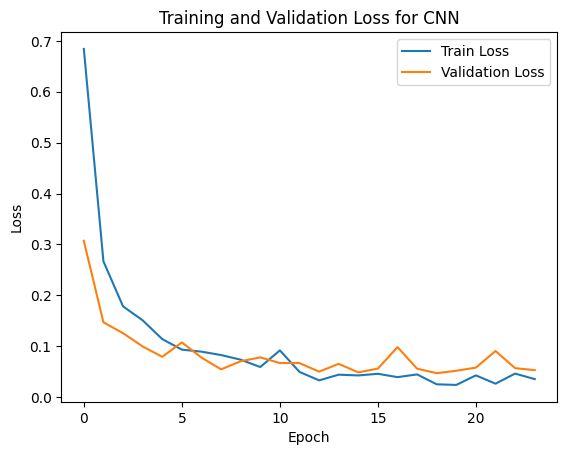

In [96]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for CNN")
plt.show()

# **Model Evaluation and Matrics Calculation for CNN**

In [97]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()

all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')
        
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_preds.extend(predicted.cpu().numpy()) 
        all_labels.extend(labels.cpu().numpy())   

accuracy = accuracy_score(all_labels, all_preds)
precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 98.41%
Precision: 0.9841
Recall: 0.9841
F1 Score: 0.9840


# C**onfusion Matrix for Custom CNN**

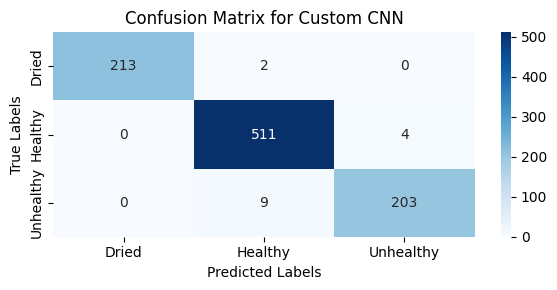

In [99]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(all_labels, all_preds)

class_names = dataset.classes

plt.figure(figsize=(6, 3))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for Custom CNN')
plt.tight_layout()
plt.show()


# **Transfer Learning using VGG19**

In [100]:
from tqdm import tqdm 
from torch.cuda.amp import autocast, GradScaler 

num_epochs = 50 

model = get_transfer_model('vgg19', num_classes).to('cuda')
criterion = nn.CrossEntropyLoss() 

optimizer = optim.Adam(model.parameters(), lr=0.00001) 

early_stopping = EarlyStopping(patience=5)  

train_losses, val_losses = [], []  

scaler = GradScaler()

for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    
    model.train() 
    train_loss = 0 
    
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda')  

        optimizer.zero_grad()  

        with autocast(): 
            outputs = model(images)  
            loss = criterion(outputs, labels)  

        scaler.scale(loss).backward()  
        scaler.step(optimizer) 
        scaler.update()  
        train_loss += loss.item()  

    model.eval() 
    val_loss = 0  
    with torch.no_grad():  
        
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda') 
            with autocast():  
                outputs = model(images)  
                loss = criterion(outputs, labels)  
            val_loss += loss.item()  

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break

torch.save(model.state_dict(), 'transfer_learning_vgg_19.pth')
print("Model saved as 'transfer_learning_vgg_19.pth'")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_137/916104243.py:15: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/916104243.py:29: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/916104243.py:45: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.2244, Validation Loss: 0.0164
Epoch 2/50


Train Loss: 0.0141, Validation Loss: 0.1356
Epoch 3/50


Train Loss: 0.0046, Validation Loss: 0.0159
Epoch 4/50


Train Loss: 0.0021, Validation Loss: 0.0043
Epoch 5/50


Train Loss: 0.0001, Validation Loss: 0.0040
Epoch 6/50


Train Loss: 0.0001, Validation Loss: 0.0041
Epoch 7/50


Train Loss: 0.0003, Validation Loss: 0.0034
Epoch 8/50


Train Loss: 0.0001, Validation Loss: 0.0036
Epoch 9/50


Train Loss: 0.0000, Validation Loss: 0.0037
Epoch 10/50


Train Loss: 0.0000, Validation Loss: 0.0037
Epoch 11/50


Train Loss: 0.0000, Validation Loss: 0.0040
Epoch 12/50


Train Loss: 0.0000, Validation Loss: 0.0039
Early stopping triggered.
Model saved as 'transfer_learning_vgg_19.pth'


# **Loss Curve for VGG19**

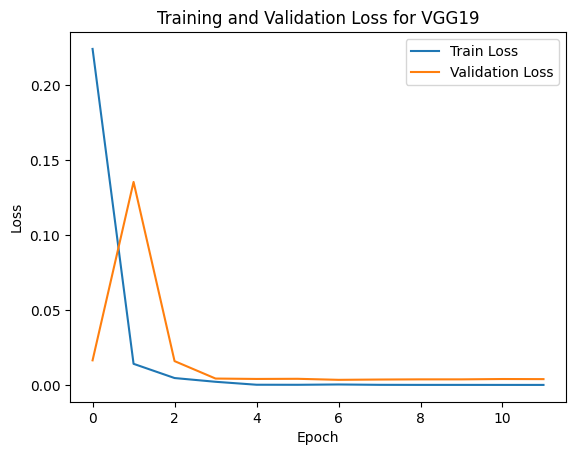

In [101]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for VGG19")
plt.show()

# **Model Evaluation and Matrics Calculation for VGG19**

In [91]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()

all_preds_vgg = []
all_labels_vgg = []

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')
        
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_preds.extend(predicted.cpu().numpy()) 
        all_labels.extend(labels.cpu().numpy())   

accuracy = accuracy_score(all_labels_vgg, all_preds_vgg)
precision = precision_score(all_labels_vgg, all_preds_vgg, average='weighted', zero_division=0)
recall = recall_score(all_labels_vgg, all_preds_vgg, average='weighted', zero_division=0)
f1 = f1_score(all_labels_vgg, all_preds_vgg, average='weighted', zero_division=0)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")



Accuracy: 89.92%
Precision: 0.9028
Recall: 0.8992
F1 Score: 0.9004


# **Confusion Matrix for VGG19**

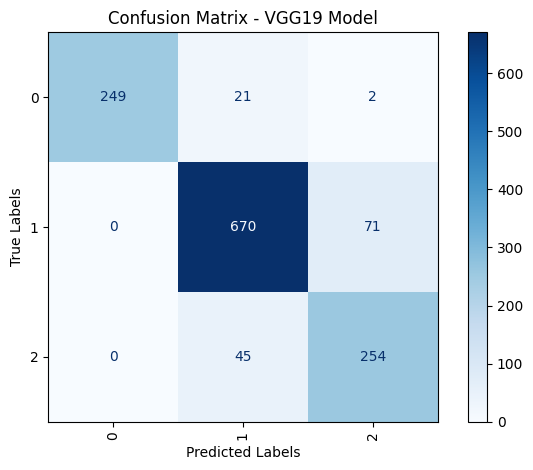

In [89]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(all_labels_vgg, all_preds_vgg)

class_names = dataset.classes

plt.figure(figsize=(8, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for VGG19')
plt.tight_layout()
plt.show()


# **Transfer Learning using EfficientNet-B3**

In [102]:
from torch.cuda.amp import autocast, GradScaler  

num_epochs = 50 

model = get_transfer_model('efficientnet_b3', num_classes).to('cuda')
criterion = nn.CrossEntropyLoss()  

optimizer = optim.Adam(model.parameters(), lr=0.001)  

early_stopping = EarlyStopping(patience=5) 

train_losses, val_losses = [], []  

scaler = GradScaler()

for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train() 
    train_loss = 0  
    
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda') 

        optimizer.zero_grad() 

        with autocast(): 
            outputs = model(images)  
            loss = criterion(outputs, labels) 

        scaler.scale(loss).backward()  
        scaler.step(optimizer)  
        scaler.update()  
        train_loss += loss.item()  

    model.eval() 
    val_loss = 0 
    with torch.no_grad():  
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda')  
            with autocast():  
                outputs = model(images) 
                loss = criterion(outputs, labels) 
            val_loss += loss.item()  

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break


torch.save(model.state_dict(), 'transfer_learning_efficientnet_b3.pth')
print("Model saved as 'transfer_learning_efficientnet_b3.pth'")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B3_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B3_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_137/789226327.py:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/789226327.py:27: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/789226327.py:41: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.1402, Validation Loss: 0.0382
Epoch 2/50


Train Loss: 0.0552, Validation Loss: 0.0099
Epoch 3/50


Train Loss: 0.0245, Validation Loss: 0.0145
Epoch 4/50


Train Loss: 0.0101, Validation Loss: 0.0052
Epoch 5/50


Train Loss: 0.0071, Validation Loss: 0.0114
Epoch 6/50


Train Loss: 0.0547, Validation Loss: 0.0282
Epoch 7/50


Train Loss: 0.0452, Validation Loss: 0.0564
Epoch 8/50


Train Loss: 0.0137, Validation Loss: 0.0086
Epoch 9/50


Train Loss: 0.0066, Validation Loss: 0.0035
Epoch 10/50


Train Loss: 0.0119, Validation Loss: 0.0432
Epoch 11/50


Train Loss: 0.0100, Validation Loss: 0.0099
Epoch 12/50


Train Loss: 0.0175, Validation Loss: 0.0028
Epoch 13/50


Train Loss: 0.0022, Validation Loss: 0.0048
Epoch 14/50


Train Loss: 0.0032, Validation Loss: 0.0025
Epoch 15/50


Train Loss: 0.0104, Validation Loss: 0.0027
Epoch 16/50


Train Loss: 0.0146, Validation Loss: 0.0202
Epoch 17/50


Train Loss: 0.0196, Validation Loss: 0.0019
Epoch 18/50


Train Loss: 0.0035, Validation Loss: 0.0027
Epoch 19/50


Train Loss: 0.0090, Validation Loss: 0.0057
Epoch 20/50


Train Loss: 0.0209, Validation Loss: 0.0055
Epoch 21/50


Train Loss: 0.0041, Validation Loss: 0.0039
Epoch 22/50


Train Loss: 0.0021, Validation Loss: 0.0033
Early stopping triggered.
Model saved as 'transfer_learning_efficientnet_b3.pth'


# **Loss Curve for EfficientNet-B3**

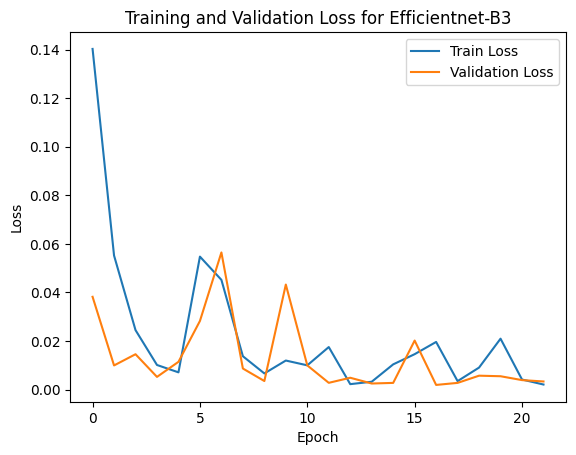

In [103]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for Efficientnet-B3")
plt.show()

#  **Model Evaluation and Matrics Calculation for EfficientNet-B3**

In [105]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()

all_preds_b3 = []
all_labels_b3 = []

with torch.no_grad(): 
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_preds_b3.extend(predicted.cpu().numpy())  
        all_labels_b3.extend(labels.cpu().numpy())   


accuracy = accuracy_score(all_labels_b3, all_preds_b3)
precision = precision_score(all_labels_b3, all_preds_b3, average='weighted', zero_division=0)
recall = recall_score(all_labels_b3, all_preds_b3, average='weighted', zero_division=0)
f1 = f1_score(all_labels_b3, all_preds_b3, average='weighted', zero_division=0)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 99.89%
Precision: 0.9989
Recall: 0.9989
F1 Score: 0.9989


# **Confusion Matrix for EfficientNet_B3**

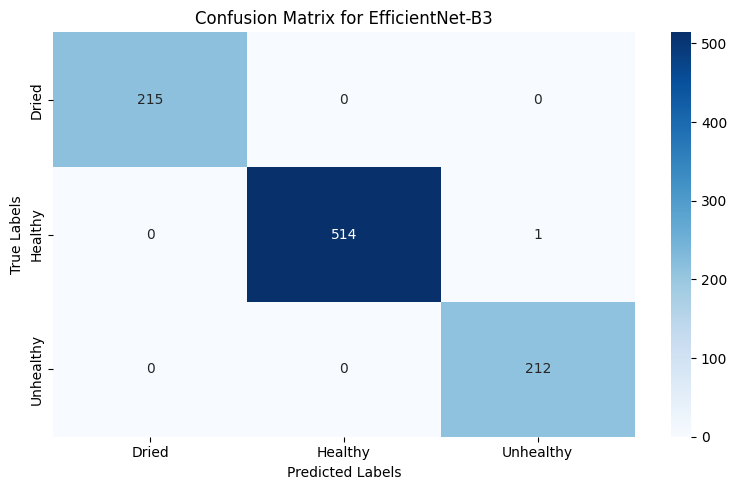

In [106]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm_b3 = confusion_matrix(all_labels_b3, all_preds_b3)

class_names = dataset.classes

plt.figure(figsize=(8, 5))
sns.heatmap(cm_b3, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for EfficientNet-B3')
plt.tight_layout()
plt.show()

# **Transfer Learning using Efficientnet-B6**

In [107]:
from tqdm import tqdm 
from torch.cuda.amp import autocast, GradScaler  

num_epochs = 50  

model = get_transfer_model('efficientnet_b6', num_classes).to('cuda')
criterion = nn.CrossEntropyLoss()  

optimizer = optim.Adam(model.parameters(), lr=0.001) 

early_stopping = EarlyStopping(patience=5) 

train_losses, val_losses = [], [] 

scaler = GradScaler()

for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    # Training phase
    model.train() 
    train_loss = 0  
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda') 

        optimizer.zero_grad() 

        with autocast():  
            outputs = model(images) 
            loss = criterion(outputs, labels)  

        scaler.scale(loss).backward()  
        scaler.step(optimizer)  
        scaler.update()  
        train_loss += loss.item() 

    model.eval()  
    val_loss = 0 
    with torch.no_grad(): 
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda')  
            with autocast(): 
                outputs = model(images)  
                loss = criterion(outputs, labels)  
            val_loss += loss.item() 

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break


torch.save(model.state_dict(), 'transfer_learning_efficientnet_b6.pth')
print("Model saved as 'transfer_learning_efficientnet_b6.pth'")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=EfficientNet_B6_Weights.IMAGENET1K_V1`. You can also use `weights=EfficientNet_B6_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_137/975220637.py:15: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/975220637.py:28: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/975220637.py:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.1428, Validation Loss: 0.5834
Epoch 2/50


Train Loss: 0.0514, Validation Loss: 0.0333
Epoch 3/50


Train Loss: 0.0387, Validation Loss: 0.0272
Epoch 4/50


Train Loss: 0.0264, Validation Loss: 0.0056
Epoch 5/50


Train Loss: 0.0216, Validation Loss: 0.0084
Epoch 6/50


Train Loss: 0.0071, Validation Loss: 0.0045
Epoch 7/50


Train Loss: 0.0234, Validation Loss: 0.0118
Epoch 8/50


Train Loss: 0.0251, Validation Loss: 26.2732
Epoch 9/50


Train Loss: 0.0046, Validation Loss: 0.0054
Epoch 10/50


Train Loss: 0.0173, Validation Loss: 0.0246
Epoch 11/50


Train Loss: 0.0131, Validation Loss: 0.0146
Early stopping triggered.
Model saved as 'transfer_learning_efficientnet_b6.pth'


# **Loss Curve for Efficientnet-B6**

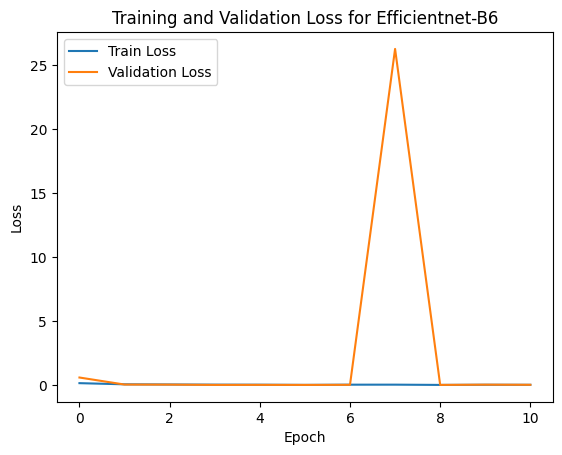

In [108]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for Efficientnet-B6")
plt.show()

# **Model Evaluation and Matrics Calculation for Efficientnet-B6**

In [109]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()

all_preds_b6 = []
all_labels_b6 = []

with torch.no_grad(): 
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_preds_b6.extend(predicted.cpu().numpy())  
        all_labels_b6.extend(labels.cpu().numpy())   


accuracy = accuracy_score(all_labels_b6, all_preds_b6)
precision = precision_score(all_labels_b6, all_preds_b6, average='weighted', zero_division=0)
recall = recall_score(all_labels_b6, all_preds_b6, average='weighted', zero_division=0)
f1 = f1_score(all_labels_b6, all_preds_b6, average='weighted', zero_division=0)

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 99.58%
Precision: 0.9958
Recall: 0.9958
F1 Score: 0.9958


# **Confusion Matrix for EfficientNet-B6**

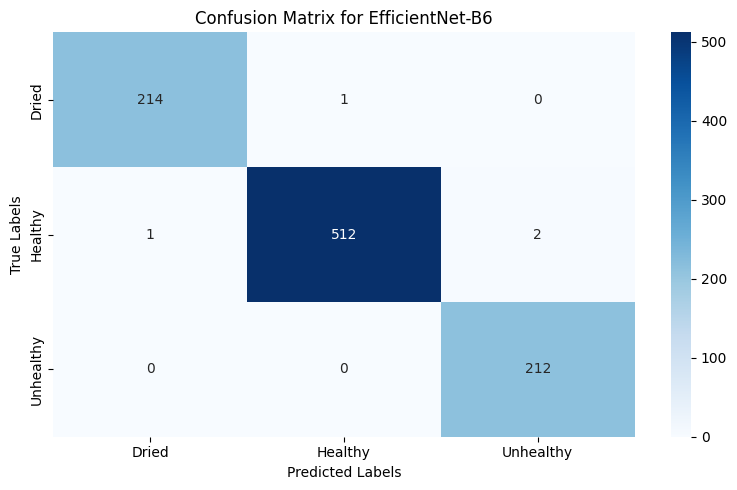

In [110]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm_b6 = confusion_matrix(all_labels_b6, all_preds_b6)

class_names = dataset.classes

plt.figure(figsize=(8, 5))
sns.heatmap(cm_b6, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for EfficientNet-B6')
plt.tight_layout()
plt.show()

# **Transfer Learning using  Densenet-201**

In [111]:
from tqdm import tqdm  
from torch.cuda.amp import autocast, GradScaler  

num_epochs = 50 

model = get_transfer_model('densenet201', num_classes).to('cuda')
criterion = nn.CrossEntropyLoss()  

optimizer = optim.Adam(model.parameters(), lr=0.001) 
early_stopping = EarlyStopping(patience=5) 

train_losses, val_losses = [], []  
scaler = GradScaler()
for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    model.train() 
    train_loss = 0  
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda')  

        optimizer.zero_grad()
        with autocast():  
            outputs = model(images) 
            loss = criterion(outputs, labels) 

        scaler.scale(loss).backward() 
        scaler.step(optimizer)  
        scaler.update()  
        train_loss += loss.item()  

    model.eval() 
    val_loss = 0  
    with torch.no_grad():  
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda') 
            with autocast(): 
                outputs = model(images)  
                loss = criterion(outputs, labels) 
            val_loss += loss.item()  

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break


torch.save(model.state_dict(), 'transfer_learning_densenet_201.pth')
print("Model saved as 'transfer_learning_densenet_201.pth'")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet201_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet201_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_137/2943699367.py:13: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/2943699367.py:23: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/2943699367.py:37: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.2339, Validation Loss: 0.1430
Epoch 2/50


Train Loss: 0.1048, Validation Loss: 0.1631
Epoch 3/50


Train Loss: 0.0704, Validation Loss: 0.0503
Epoch 4/50


Train Loss: 0.0872, Validation Loss: 0.0257
Epoch 5/50


Train Loss: 0.0397, Validation Loss: 0.0348
Epoch 6/50


Train Loss: 0.0292, Validation Loss: 0.0664
Epoch 7/50


Train Loss: 0.0297, Validation Loss: 0.0719
Epoch 8/50


Train Loss: 0.0359, Validation Loss: 0.0104
Epoch 9/50


Train Loss: 0.0153, Validation Loss: 0.0564
Epoch 10/50


Train Loss: 0.0446, Validation Loss: 0.0658
Epoch 11/50


Train Loss: 0.0366, Validation Loss: 0.0378
Epoch 12/50


Train Loss: 0.0314, Validation Loss: 0.0279
Epoch 13/50


Train Loss: 0.0105, Validation Loss: 0.0361
Early stopping triggered.
Model saved as 'transfer_learning_densenet_201.pth'


# **Loss Curve for Densenet-201**

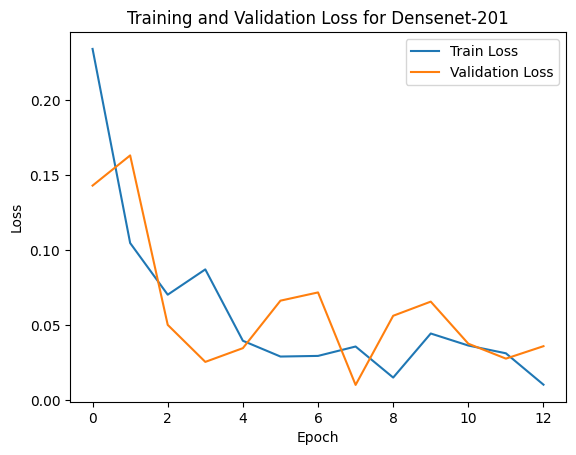

In [112]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for Densenet-201")
plt.show()

#  **Model Evaluation and Matrics Calculation for Densenet-201**

In [113]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()

all_preds_des = []
all_labels_des = []

# Run inference
with torch.no_grad(): 
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')

        outputs = model(images)

        _, predicted = torch.max(outputs, 1)

        all_preds_des.extend(predicted.cpu().numpy())  
        all_labels_des.extend(labels.cpu().numpy())   

accuracy = accuracy_score(all_labels_des, all_preds_des)
precision = precision_score(all_labels_des, all_preds_des, average='weighted')
recall = recall_score(all_labels_des, all_preds_des, average='weighted')
f1 = f1_score(all_labels_des, all_preds_des, average='weighted')


print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 98.83%
Precision: 0.9886
Recall: 0.9883
F1 Score: 0.9883


# **Confusion Matrix for DenseNet-201**

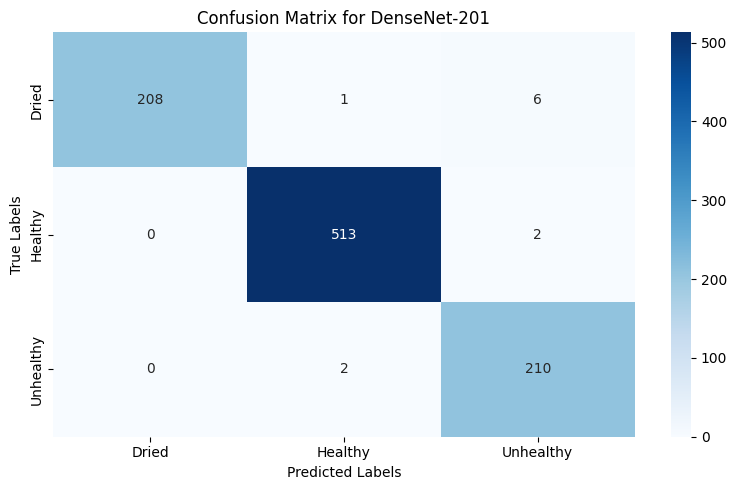

In [115]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm_des = confusion_matrix(all_labels_des, all_preds_des)

class_names = dataset.classes

plt.figure(figsize=(8, 5))
sns.heatmap(cm_des, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for DenseNet-201')
plt.tight_layout()
plt.show()

# **Transfer Learning using Resnet-152**

In [116]:
from tqdm import tqdm  
from torch.cuda.amp import autocast, GradScaler  

num_epochs = 50 

model = get_transfer_model('resnet152', num_classes).to('cuda')
criterion = nn.CrossEntropyLoss()  

optimizer = optim.Adam(model.parameters(), lr=0.001)  

early_stopping = EarlyStopping(patience=5)  
train_losses, val_losses = [], [] 

scaler = GradScaler()

for epoch in range(num_epochs):

    print(f"Epoch {epoch+1}/{num_epochs}")
    # Training phase
    model.train()  
    train_loss = 0  
    for images, labels in tqdm(train_loader, desc="Training", leave=False):
        images, labels = images.to('cuda'), labels.to('cuda')  
        optimizer.zero_grad()  

        with autocast():  
            outputs = model(images)  
            loss = criterion(outputs, labels)  
        scaler.scale(loss).backward() 
        scaler.step(optimizer)  
        scaler.update() 
        train_loss += loss.item()  

    model.eval()  
    val_loss = 0  
    with torch.no_grad():  
        for images, labels in tqdm(val_loader, desc="Validation", leave=False):
            images, labels = images.to('cuda'), labels.to('cuda')  
            with autocast():  
                outputs = model(images)  
                loss = criterion(outputs, labels)  
            val_loss += loss.item() 

    avg_train_loss = train_loss / len(train_loader)
    avg_val_loss = val_loss / len(val_loader)
    train_losses.append(avg_train_loss)
    val_losses.append(avg_val_loss)

    print(f"Train Loss: {avg_train_loss:.4f}, Validation Loss: {avg_val_loss:.4f}")

    if early_stopping.check_early_stop(avg_val_loss):
        print("Early stopping triggered.")
        break


torch.save(model.state_dict(), 'transfer_learning_resnet_152.pth')
print("Model saved as 'transfer_learning_resnet_152.pth'")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet152_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet152_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
/tmp/ipykernel_137/2272239794.py:14: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = GradScaler()


Epoch 1/50


Training:   0%|          | 0/206 [00:00<?, ?it/s]/tmp/ipykernel_137/2272239794.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():
Validation:   0%|          | 0/59 [00:00<?, ?it/s]         /tmp/ipykernel_137/2272239794.py:39: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with autocast():


Train Loss: 0.4091, Validation Loss: 0.2055
Epoch 2/50


Train Loss: 0.2073, Validation Loss: 0.1136
Epoch 3/50


Train Loss: 0.1472, Validation Loss: 0.1898
Epoch 4/50


Train Loss: 0.1090, Validation Loss: 0.2525
Epoch 5/50


Train Loss: 0.1081, Validation Loss: 0.0502
Epoch 6/50


Train Loss: 0.0916, Validation Loss: 0.0637
Epoch 7/50


Train Loss: 0.0720, Validation Loss: 0.1177
Epoch 8/50


Train Loss: 0.0766, Validation Loss: 0.0552
Epoch 9/50


Train Loss: 0.0618, Validation Loss: 0.0666
Epoch 10/50


Train Loss: 0.0554, Validation Loss: 0.1102
Early stopping triggered.
Model saved as 'transfer_learning_resnet_152.pth'


# **Loss Curve for Resnet-152**

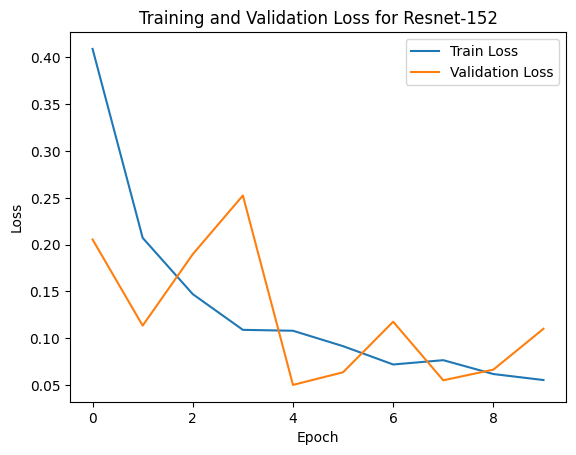

In [117]:
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title("Training and Validation Loss for Resnet-152")
plt.show()

#  **Model Evaluation and Matrics Calculation for Resnet-152**

In [118]:
import torch
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

model.eval()


all_preds_res = []
all_labels_res = []

with torch.no_grad(): 
    for images, labels in test_loader:
        images, labels = images.to('cuda'), labels.to('cuda')

        outputs = model(images)

        _, predicted = torch.max(outputs, 1)

        all_preds_res.extend(predicted.cpu().numpy())  
        all_labels_res.extend(labels.cpu().numpy())    

accuracy = accuracy_score(all_labels_res, all_preds_res)
precision = precision_score(all_labels_res, all_preds_res, average='weighted')
recall = recall_score(all_labels_res, all_preds_res, average='weighted')
f1 = f1_score(all_labels_res, all_preds_res, average='weighted')

print(f"Accuracy: {accuracy * 100:.2f}%")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")


Accuracy: 96.71%
Precision: 0.9685
Recall: 0.9671
F1 Score: 0.9674


# **Confusion Matrix for ResNet-152**

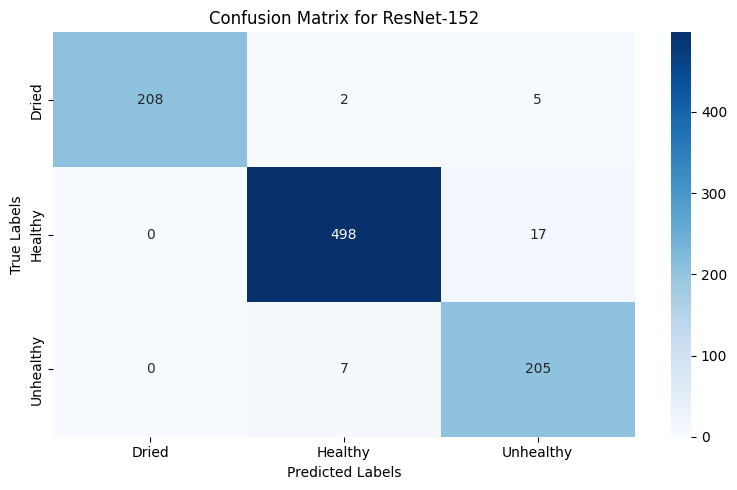

In [120]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix

cm_res = confusion_matrix(all_labels_res, all_preds_res)

class_names = dataset.classes

plt.figure(figsize=(8, 5))
sns.heatmap(cm_res, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names, yticklabels=class_names)

plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix for ResNet-152')
plt.tight_layout()
plt.show()

# **XAI- Grad-CAM, Grad-CAM++, Eigen-CAM**

# **Load the fine-tuned CNN model**

/tmp/ipykernel_137/758097772.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("cnn_model.pth"))


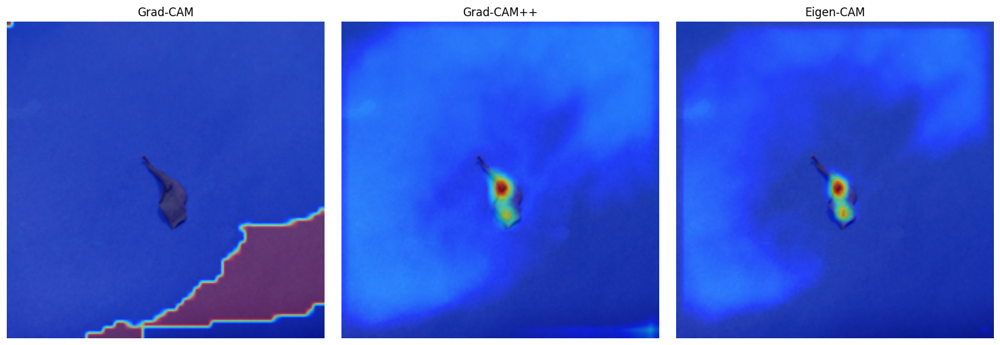

In [121]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from pytorch_grad_cam import GradCAM, GradCAMPlusPlus, EigenCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

num_classes = len(dataset.classes)
model = CustomCNN().to('cuda')
model.load_state_dict(torch.load("cnn_model.pth"))
model.eval()

sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda')  

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)


target_layers = [model.conv3]  

gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)


with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class]

target = [ClassifierOutputTarget(predicted_class)]

gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]

gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Grad-CAM")
plt.imshow(gradcam_result)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Grad-CAM++")
plt.imshow(gradcam_pp_result)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Eigen-CAM")
plt.imshow(eigen_cam_result)
plt.axis('off')

plt.tight_layout()
plt.show()


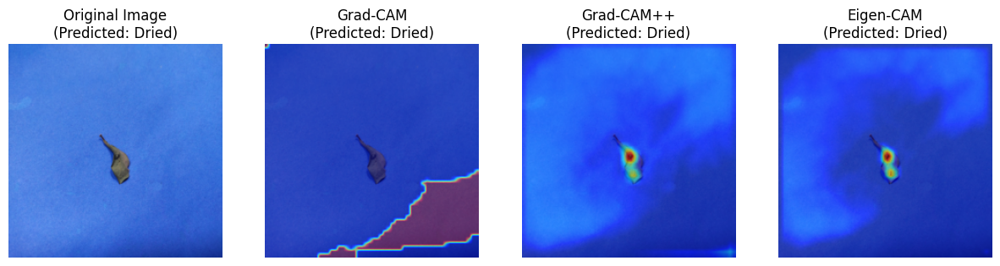

In [122]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

/tmp/ipykernel_137/2317409062.py:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("cnn_model.pth"))


  0%|          | 0/100 [00:00<?, ?it/s]

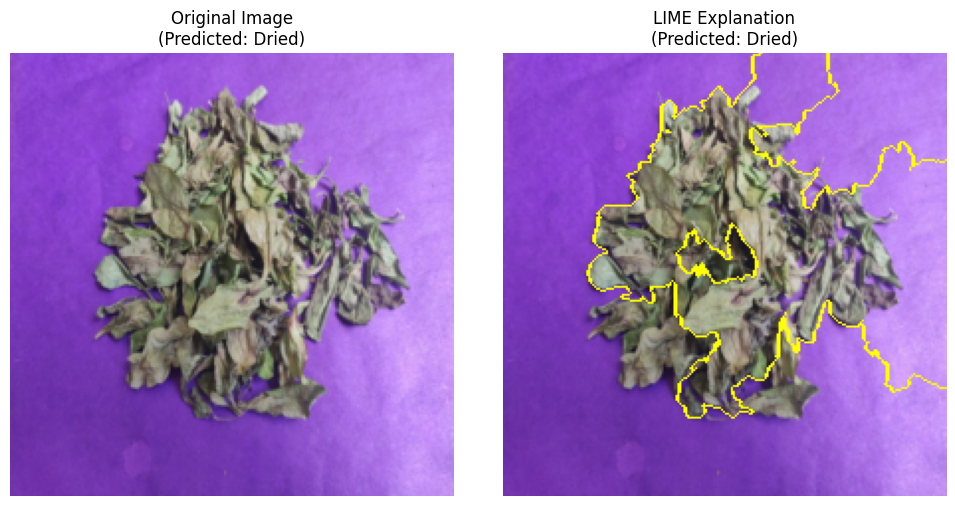

In [123]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import torch
import numpy as np
import matplotlib.pyplot as plt

num_classes = len(dataset.classes)
model = CustomCNN().to('cuda')
model.load_state_dict(torch.load("cnn_model.pth"))
model.eval()

sample_image, _ = dataset[0] 
original_image_np = sample_image.permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5 
original_image_np = np.clip(original_image_np, 0, 1)

def batch_predict(images):
    model.eval()

    batch = torch.stack([
        transform_test(Image.fromarray((img * 255).astype(np.uint8)))
        for img in images
    ], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

lime_explanation = explainer.explain_instance(
    original_image_np,   
    batch_predict,     
    top_labels=1,        
    hide_color=0,        
    num_samples=100      
)


with torch.no_grad():
    predicted_class = model(sample_image.unsqueeze(0).to('cuda')).argmax().item()

lime_image_result, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image_result = mark_boundaries(lime_image_result, lime_mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image_result)
plt.title(f"LIME Explanation\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.tight_layout()
plt.show()


# **Load the fine-tuned Vgg19 model**

/tmp/ipykernel_137/638385032.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_vgg_19.pth"))


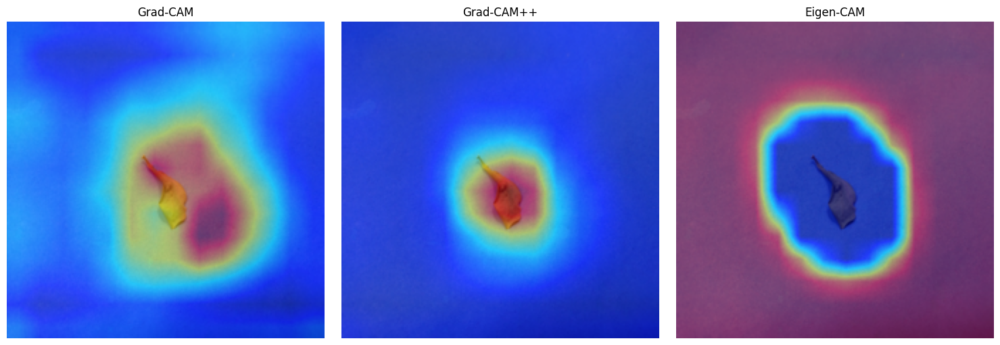

In [124]:
num_classes = len(dataset.classes)

model = models.vgg19(weights=models.VGG19_Weights.IMAGENET1K_V1)

model.classifier[6] = nn.Linear(model.classifier[6].in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_vgg_19.pth"))
model = model.to('cuda')
model.eval()

sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda')

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5
original_image_np = np.clip(original_image_np, 0, 1)

target_layers = [model.features[35]]

gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)

with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class]


target = [ClassifierOutputTarget(predicted_class)]
gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]

gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.title("Grad-CAM")
plt.imshow(gradcam_result)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Grad-CAM++")
plt.imshow(gradcam_pp_result)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Eigen-CAM")
plt.imshow(eigen_cam_result)
plt.axis('off')

plt.tight_layout()
plt.show()


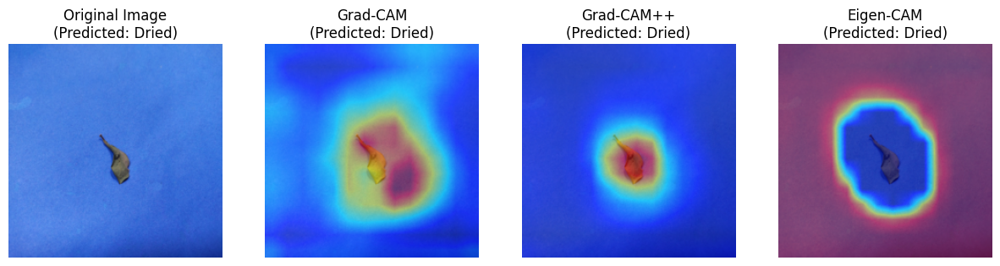

In [125]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

  0%|          | 0/100 [00:00<?, ?it/s]

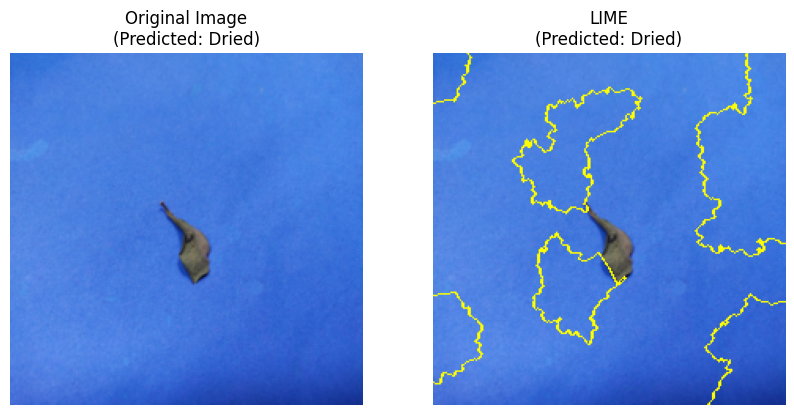

In [126]:
def batch_predict(images):
    model.eval()
   
    batch = torch.stack([transform_test(Image.fromarray((image * 255).astype(np.uint8))) for image in images], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()


lime_explanation = explainer.explain_instance(
    original_image_np,
    batch_predict,      
    top_labels=1,      
    hide_color=0,
    num_samples=100   
)

predicted_class = model(sample_image.to('cuda')).argmax().item()
lime_image, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image = mark_boundaries(lime_image, lime_mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image)
plt.title(f"LIME\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.show()


# **Load the fine-tuned Efficientnet-B3 model**

In [127]:
num_classes = len(dataset.classes)

model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1)

model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_efficientnet_b3.pth"))

model = model.to('cuda')
model.eval()

sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda')  

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5 
original_image_np = np.clip(original_image_np, 0, 1)

# Set up Grad-CAM, Grad-CAM++, and Eigen-CAM
target_layers = [model.features[-1]]

# Initialize CAM methods
gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)

with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class]  # Get the class name

target = [ClassifierOutputTarget(predicted_class)]

gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]

gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)


/tmp/ipykernel_137/918682404.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_efficientnet_b3.pth"))


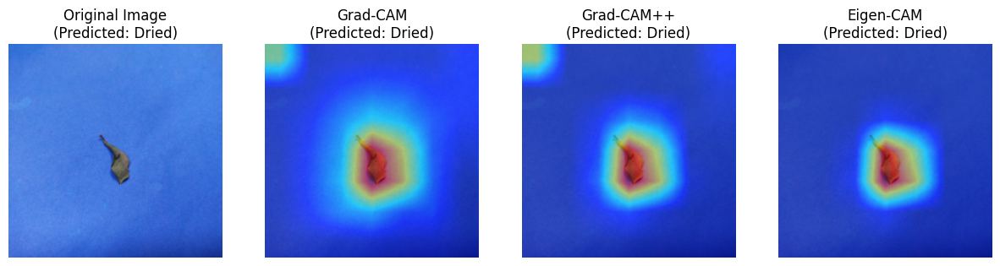

In [128]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

/tmp/ipykernel_137/194685774.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_efficientnet_b3.pth"))


  0%|          | 0/100 [00:00<?, ?it/s]

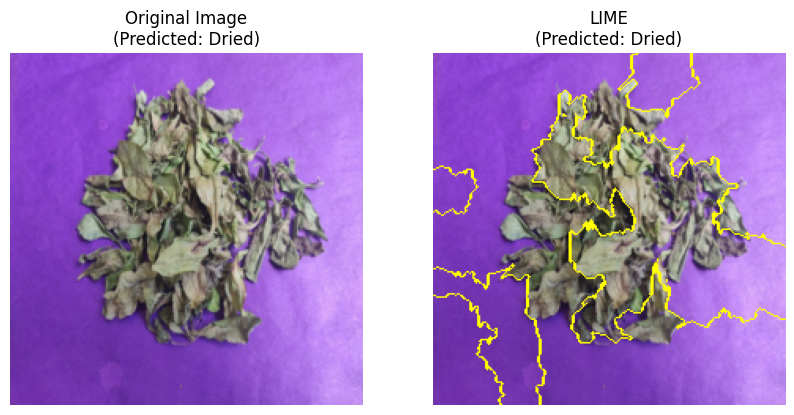

In [129]:
import torch
import torch.nn as nn
from torchvision import models
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


num_classes = len(dataset.classes)

model = models.efficientnet_b3(weights=models.EfficientNet_B3_Weights.IMAGENET1K_V1)

model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_efficientnet_b3.pth"))

model = model.to('cuda')
model.eval() 

sample_image, _ = dataset[0]  
original_image_np = sample_image.permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)  

def batch_predict(images):
    model.eval()
    batch = torch.stack([transform_test(Image.fromarray((image * 255).astype(np.uint8))) for image in images], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

lime_explanation = explainer.explain_instance(
    original_image_np, 
    batch_predict,     
    top_labels=1,     
    hide_color=0,
    num_samples=100    
)


predicted_class = model(sample_image.unsqueeze(0).to('cuda')).argmax().item()
lime_image, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image = mark_boundaries(lime_image, lime_mask)


plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image)
plt.title(f"LIME\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.show()


# **Load the fine-tuned Efficientnet-B6 model**

In [130]:
num_classes = len(dataset.classes)

model = models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1)

model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_efficientnet_b6.pth"))

model = model.to('cuda')
model.eval()  

sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda') 

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)


target_layers = [model.features[-1]]


gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)

with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class] 


target = [ClassifierOutputTarget(predicted_class)]

gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]

gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)

/tmp/ipykernel_137/4185692300.py:7: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_efficientnet_b6.pth"))


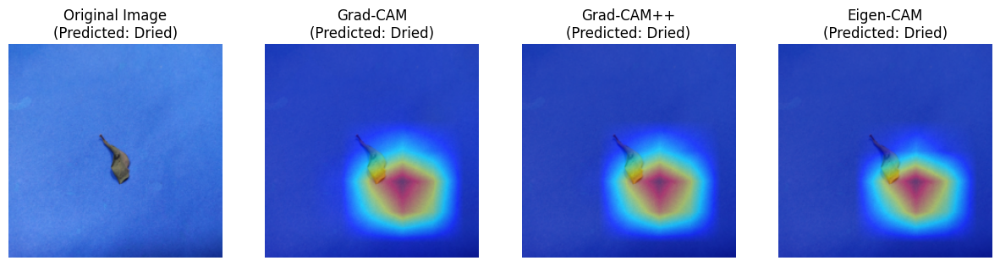

In [131]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

/tmp/ipykernel_137/1289058601.py:17: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_efficientnet_b6.pth"))


  0%|          | 0/100 [00:00<?, ?it/s]

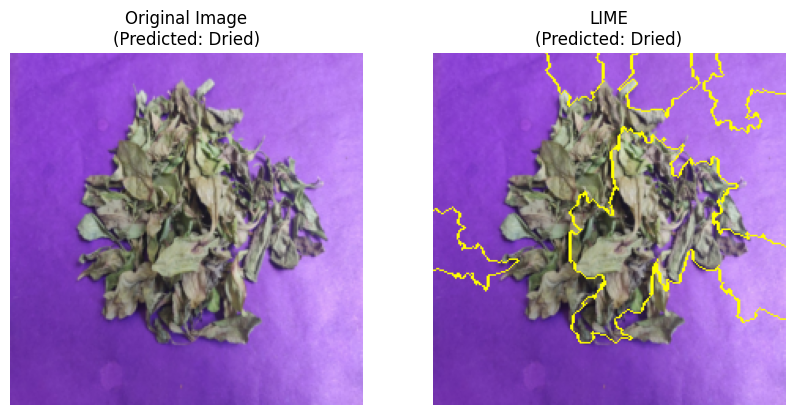

In [132]:
import torch
import torch.nn as nn
from torchvision import models
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt


num_classes = len(dataset.classes)

model = models.efficientnet_b6(weights=models.EfficientNet_B6_Weights.IMAGENET1K_V1)

model.classifier[1] = nn.Linear(model.classifier[1].in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_efficientnet_b6.pth"))

model = model.to('cuda')
model.eval() 


sample_image, _ = dataset[0] 
original_image_np = sample_image.permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)  


def batch_predict(images):
    model.eval()
    batch = torch.stack([transform_test(Image.fromarray((image * 255).astype(np.uint8))) for image in images], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

lime_explanation = explainer.explain_instance(
    original_image_np,  
    batch_predict,      
    top_labels=1,       
    hide_color=0,
    num_samples=100    
)

predicted_class = model(sample_image.unsqueeze(0).to('cuda')).argmax().item()
lime_image, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image = mark_boundaries(lime_image, lime_mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image)
plt.title(f"LIME\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.show()


# **Load the fine-tuned Densenet-201 model**

/tmp/ipykernel_137/2942924822.py:9: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_densenet_201.pth"))


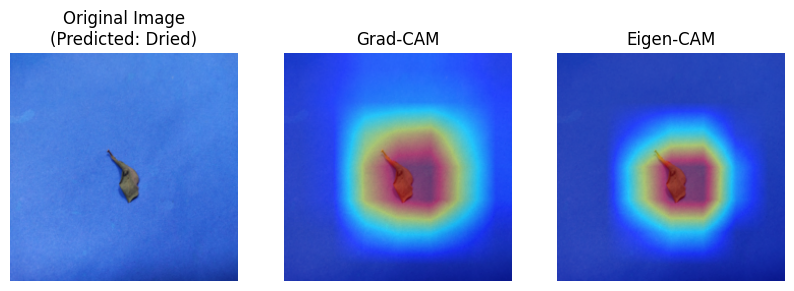

In [133]:
import matplotlib.pyplot as plt

num_classes = len(dataset.classes)

model = models.densenet201(weights=models.DenseNet201_Weights.IMAGENET1K_V1)

model.classifier = nn.Linear(model.classifier.in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_densenet_201.pth"))

model = model.to('cuda')
model.eval() 

sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda')  

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)


target_layers = [model.features[-1]] 


gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)


with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class]  # Get the class name


target = [ClassifierOutputTarget(predicted_class)]

gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]


gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)

plt.figure(figsize=(10, 5))


plt.subplot(1, 3, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis('off')


plt.subplot(1, 3, 2)
plt.imshow(gradcam_result)
plt.title("Grad-CAM")
plt.axis('off')


plt.subplot(1, 3, 3)
plt.imshow(eigen_cam_result)
plt.title("Eigen-CAM")
plt.axis('off')

plt.show()


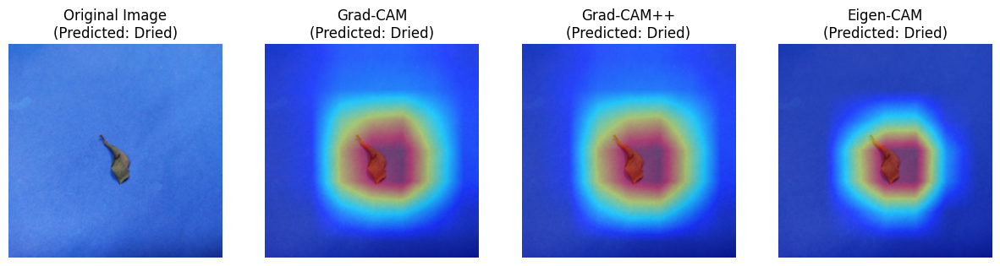

In [134]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

/tmp/ipykernel_137/3493267449.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_densenet_201.pth"))


  0%|          | 0/100 [00:00<?, ?it/s]

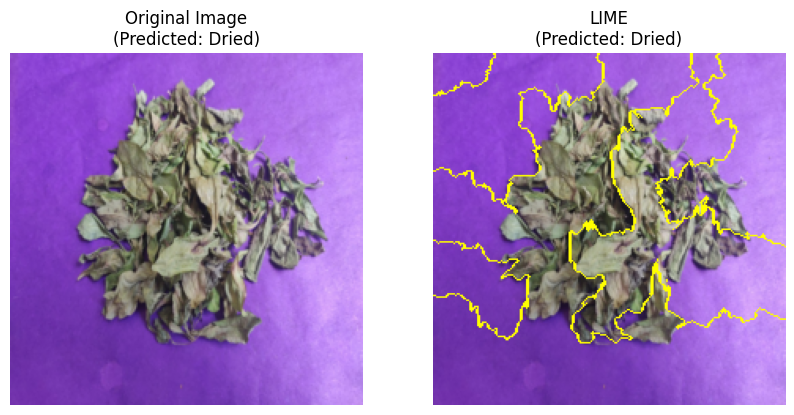

In [135]:
import torch
import torch.nn as nn
from torchvision import models
from lime import lime_image
from skimage.segmentation import mark_boundaries
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

model = models.densenet201(weights=models.DenseNet201_Weights.IMAGENET1K_V1)

model.classifier = nn.Linear(model.classifier.in_features, num_classes)

model.load_state_dict(torch.load("transfer_learning_densenet_201.pth"))

model = model.to('cuda')
model.eval() 

sample_image, _ = dataset[0]  
original_image_np = sample_image.permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)  


def batch_predict(images):
    model.eval()
    batch = torch.stack([transform_test(Image.fromarray((image * 255).astype(np.uint8))) for image in images], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

lime_explanation = explainer.explain_instance(
    original_image_np,  
    batch_predict,      
    top_labels=1,      
    hide_color=0,
    num_samples=100    
)

predicted_class = model(sample_image.unsqueeze(0).to('cuda')).argmax().item()
lime_image, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image = mark_boundaries(lime_image, lime_mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image)
plt.title(f"LIME\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.show()


# **Load the fine-tuned Resnet-152 model**

In [136]:
num_classes = len(dataset.classes)
model = models.resnet152(weights=models.ResNet152_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load("transfer_learning_resnet_152.pth"))
model = model.to('cuda')
model.eval()  


sample_image, _ = test_dataset[0]
sample_image = sample_image.unsqueeze(0).to('cuda')  

original_image_np = sample_image.squeeze(0).permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1)


target_layers = [model.layer4[-1]]


gradcam = GradCAM(model=model, target_layers=target_layers)
gradcam_plus_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)
eigen_cam = EigenCAM(model=model, target_layers=target_layers)


with torch.no_grad():
    outputs = model(sample_image)
    predicted_class = outputs.argmax().item()
    predicted_class_name = class_names[predicted_class]  

target = [ClassifierOutputTarget(predicted_class)]


gradcam_heatmap = gradcam(input_tensor=sample_image, targets=target)[0]
gradcam_pp_heatmap = gradcam_plus_plus(input_tensor=sample_image, targets=target)[0]
eigen_cam_heatmap = eigen_cam(input_tensor=sample_image, targets=target)[0]

gradcam_result = show_cam_on_image(original_image_np, gradcam_heatmap, use_rgb=True)
gradcam_pp_result = show_cam_on_image(original_image_np, gradcam_pp_heatmap, use_rgb=True)
eigen_cam_result = show_cam_on_image(original_image_np, eigen_cam_heatmap, use_rgb=True)


/tmp/ipykernel_137/608475208.py:4: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_resnet_152.pth"))


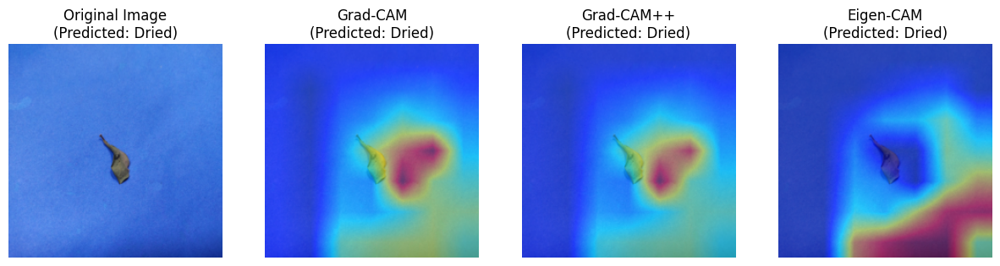

In [137]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 4, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(gradcam_result)
plt.title(f"Grad-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(gradcam_pp_result)
plt.title(f"Grad-CAM++\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(eigen_cam_result)
plt.title(f"Eigen-CAM\n(Predicted: {predicted_class_name})")
plt.axis("off")

plt.show()

/tmp/ipykernel_137/998952059.py:8: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("transfer_learning_resnet_152.pth"))


  0%|          | 0/100 [00:00<?, ?it/s]

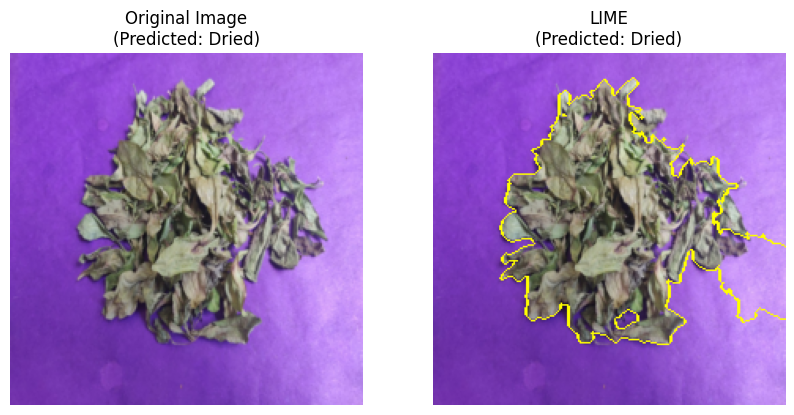

In [138]:
from lime import lime_image
from skimage.segmentation import mark_boundaries
from PIL import Image

num_classes = len(dataset.classes)
model = models.resnet152(weights=models.ResNet152_Weights.IMAGENET1K_V1)
model.fc = nn.Linear(model.fc.in_features, num_classes)
model.load_state_dict(torch.load("transfer_learning_resnet_152.pth"))
model = model.to('cuda')
model.eval()

sample_image, _ = dataset[0]  
original_image_np = sample_image.permute(1, 2, 0).cpu().numpy()
original_image_np = (original_image_np * 0.5) + 0.5  
original_image_np = np.clip(original_image_np, 0, 1) 

def batch_predict(images):
    model.eval()
    batch = torch.stack([transform_test(Image.fromarray((image * 255).astype(np.uint8))) for image in images], dim=0).to('cuda')
    with torch.no_grad():
        logits = model(batch)
    return logits.cpu().numpy()

explainer = lime_image.LimeImageExplainer()

lime_explanation = explainer.explain_instance(
    original_image_np, 
    batch_predict,      
    top_labels=1,       
    num_samples=100    
)


predicted_class = model(sample_image.unsqueeze(0).to('cuda')).argmax().item()
lime_image, lime_mask = lime_explanation.get_image_and_mask(
    label=predicted_class,
    positive_only=True,
    hide_rest=False,
    num_features=10,
    min_weight=0.01
)
lime_image = mark_boundaries(lime_image, lime_mask)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(original_image_np)
plt.title(f"Original Image\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(lime_image)
plt.title(f"LIME\n(Predicted: {class_names[predicted_class]})")
plt.axis("off")

plt.show()


# **Comparision Between Models**

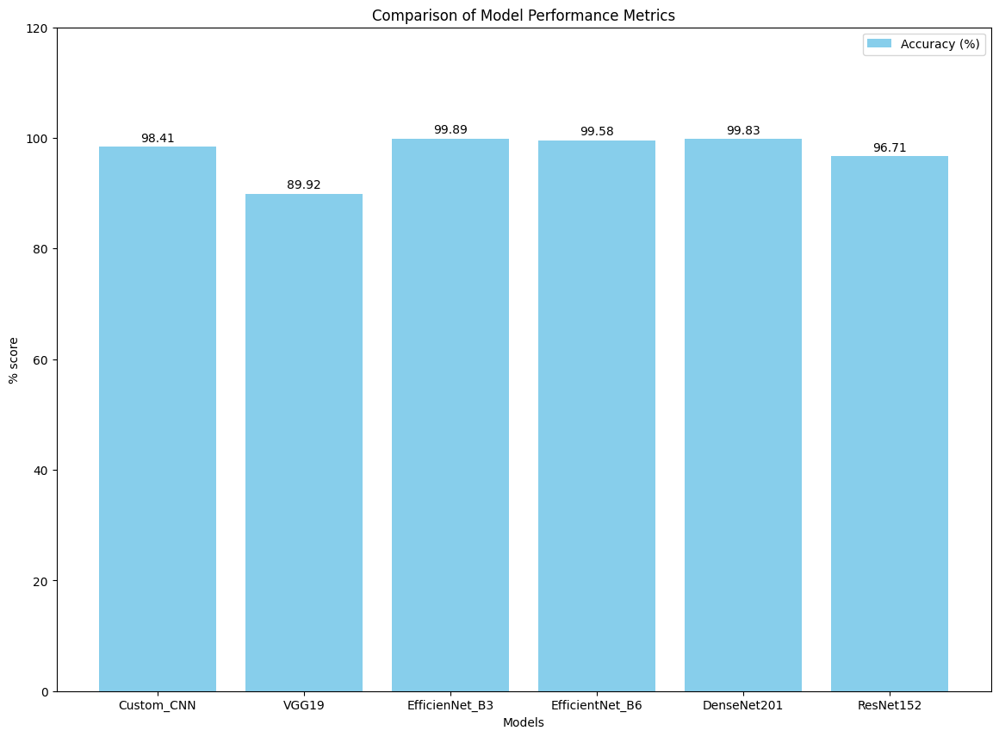

In [140]:
import matplotlib.pyplot as plt
import numpy as np

models = ['Custom_CNN', 'VGG19', 'EfficienNet_B3', 'EfficientNet_B6', 'DenseNet201', 'ResNet152']
accuracy = [98.41, 89.92, 99.89, 99.58, 99.83, 96.71]

plt.figure(figsize=(14,10))
bars = plt.bar(models, accuracy, color='skyblue')

for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.5, f'{yval:.2f}', ha='center', va='bottom')

plt.xlabel('Models')
plt.ylabel('% score')
plt.title('Comparison of Model Performance Metrics')

plt.legend(['Accuracy (%)'])
plt.ylim(0, 120)

plt.show()
